In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# CEK ISI DATA DERM12345

In [2]:
# ============================================
# CEK ISI DATA DERM12345
# ============================================
import os
import pandas as pd

# Cek path Data part 2
paths_to_check = [
    '/content/drive/My Drive/Data Projek Big Data/Data part 2',
    '/content/drive/MyDrive/Data Projek Big Data/Data part 2',
    '/content/drive/My Drive/big data/Data part 2',
    '/content/drive/MyDrive/big data/Data part 2'
]

data2_path = None
for p in paths_to_check:
    if os.path.exists(p):
        data2_path = p
        break

if data2_path:
    print(f"FOUND: {data2_path}\n")
    print("Isi folder:")
    for f in sorted(os.listdir(data2_path)):
        fp = os.path.join(data2_path, f)
        size = os.path.getsize(fp) / (1024*1024)
        print(f"  {f} ({size:.1f} MB)")
else:
    print("Tidak ditemukan! Cek isi drive:")
    base = '/content/drive/My Drive/'
    for f in sorted(os.listdir(base)):
        print(f"  {f}")

# Load metadata kalau ada
if data2_path:
    for f in os.listdir(data2_path):
        if f.endswith('.csv'):
            csv_path = os.path.join(data2_path, f)
            df = pd.read_csv(csv_path)
            print(f"\n{'='*60}")
            print(f"FILE: {f}")
            print(f"{'='*60}")
            print(f"Shape: {df.shape}")
            print(f"Columns: {list(df.columns)}")
            print(f"\nFirst 5 rows:")
            print(df.head())
            print(f"\nInfo per kolom:")
            for col in df.columns:
                unique = df[col].nunique()
                print(f"  {col}: {unique} unique values")
            if 'label' in df.columns:
                print(f"\nLabel distribution:")
                print(df['label'].value_counts())
            if 'dx' in df.columns:
                print(f"\nDx distribution:")
                print(df['dx'].value_counts())

FOUND: /content/drive/My Drive/Data Projek Big Data/Data part 2

Isi folder:
  derm12345_metadata_test.csv (0.2 MB)
  derm12345_metadata_train.csv (1.0 MB)
  derm12345_test.zip (1301.0 MB)
  derm12345_train_part_1.zip (2428.6 MB)
  derm12345_train_part_2.zip (2528.7 MB)

FILE: derm12345_metadata_test.csv
Shape: (2485, 11)
Columns: ['image_id', 'patient_id', 'image_type', 'copyright-license', 'split', 'super_class', 'malignancy', 'main_class_1', 'main_class_2', 'sub_class', 'label']

First 5 rows:
      image_id  patient_id   image_type copyright-license split  super_class  \
0  DERM_255498  PID_705848  dermoscopic             CC-BY  test  melanocytic   
1  DERM_892713  PID_897293  dermoscopic             CC-BY  test  melanocytic   
2  DERM_933091  PID_897293  dermoscopic             CC-BY  test  melanocytic   
3  DERM_980086  PID_897293  dermoscopic             CC-BY  test  melanocytic   
4  DERM_738404  PID_908846  dermoscopic             CC-BY  test  melanocytic   

  malignancy main

# CEK: Extract Status & Space

In [3]:
# ============================================
# CEK: Extract Status & Space
# ============================================
import os, shutil

base = '/content/drive/My Drive/Data Projek Big Data/Data part 2'

# Cek apakah sudah ada folder hasil extract
extracted_dirs = [f for f in os.listdir(base) if os.path.isdir(os.path.join(base, f))]
print("Folder yang sudah ada:", extracted_dirs)

# Cek free space di Colab local
import shutil
total, used, free = shutil.disk_usage('/content')
print(f"\nColab disk space:")
print(f"  Total: {total/(1024**3):.1f} GB")
print(f"  Used:  {used/(1024**3):.1f} GB")
print(f"  Free:  {free/(1024**3):.1f} GB")

# Cek free space di Drive
total_d, used_d, free_d = shutil.disk_usage('/content/drive/My Drive')
print(f"\nGoogle Drive space:")
print(f"  Free:  {free_d/(1024**3):.1f} GB")

Folder yang sudah ada: []

Colab disk space:
  Total: 112.6 GB
  Used:  47.1 GB
  Free:  65.6 GB

Google Drive space:
  Free:  62.3 GB


# EXTRACT DERM12345 KE COLAB LOCAL

In [4]:
# ============================================
# EXTRACT DERM12345 KE COLAB LOCAL
# ============================================
import zipfile, os, time

base = '/content/drive/My Drive/Data Projek Big Data/Data part 2'
dst = '/content/derm12345'
os.makedirs(dst, exist_ok=True)

zips = [
    ('derm12345_train_part_1.zip', 'train'),
    ('derm12345_train_part_2.zip', 'train'),
    ('derm12345_test.zip', 'test'),
]

for zip_name, subfolder in zips:
    zip_path = os.path.join(base, zip_name)
    extract_to = os.path.join(dst, subfolder)
    os.makedirs(extract_to, exist_ok=True)

    print(f"\nExtracting {zip_name}...")
    start = time.time()
    with zipfile.ZipFile(zip_path, 'r') as z:
        z.extractall(extract_to)
    elapsed = time.time() - start
    print(f"Done! ({elapsed/60:.1f} menit)")

    # Cek hasil
    all_files = []
    for root, dirs, files in os.walk(extract_to):
        all_files.extend([f for f in files if f.endswith('.jpg') or f.endswith('.png')])
    print(f"Total gambar di {subfolder}: {len(all_files)}")

print("\nSemua ZIP selesai di-extract!")


Extracting derm12345_train_part_1.zip...
Done! (0.9 menit)
Total gambar di train: 4459

Extracting derm12345_train_part_2.zip...
Done! (1.0 menit)
Total gambar di train: 9860

Extracting derm12345_test.zip...
Done! (0.6 menit)
Total gambar di test: 2485

Semua ZIP selesai di-extract!


# CEK STRUKTUR FOLDER DERM12345

In [5]:
# ============================================
# CEK STRUKTUR FOLDER DERM12345
# ============================================
import os

train_dir = '/content/derm12345/train'
test_dir = '/content/derm12345/test'

print("=== TRAIN FOLDER ===")
for item in sorted(os.listdir(train_dir))[:10]:
    path = os.path.join(train_dir, item)
    if os.path.isdir(path):
        count = len([f for f in os.listdir(path) if f.endswith(('.jpg','.png'))])
        print(f"  {item}/ ({count} gambar)")
    else:
        print(f"  {item} (file)")

print(f"\nTotal items di train: {len(os.listdir(train_dir))}")

# Cek apakah sudah ada subfolder per kelas atau flat
sample = os.listdir(train_dir)[0]
sample_path = os.path.join(train_dir, sample)
print(f"\nSample item: {sample}")
print(f"Is dir: {os.path.isdir(sample_path)}")
if not os.path.isdir(sample_path):
    print("-> Gambar flat (tidak ada subfolder per kelas)")
    print("-> Perlu diorganisir berdasarkan label dari CSV")

=== TRAIN FOLDER ===
  acb/ (30 gambar)
  acd/ (7 gambar)
  ajb/ (340 gambar)
  ajd/ (230 gambar)
  ak/ (47 gambar)
  alm/ (48 gambar)
  angk/ (31 gambar)
  anm/ (60 gambar)
  bcc/ (338 gambar)
  bd/ (29 gambar)

Total items di train: 40

Sample item: ha
Is dir: True


# CEK SEMUA 40 KELAS + SETUP MODELING

In [6]:
# ============================================
# CEK SEMUA 40 KELAS + SETUP MODELING
# ============================================
import os
import pandas as pd

train_dir = '/content/derm12345/train'
test_dir = '/content/derm12345/test'

# Semua kelas dan jumlah gambar
print("=== 40 KELAS DERM12345 ===")
class_info = []
for cls in sorted(os.listdir(train_dir)):
    train_path = os.path.join(train_dir, cls)
    test_path = os.path.join(test_dir, cls)
    if os.path.isdir(train_path):
        n_train = len([f for f in os.listdir(train_path) if f.endswith(('.jpg','.png'))])
        n_test = len([f for f in os.listdir(test_path) if f.endswith(('.jpg','.png'))]) if os.path.exists(test_path) else 0
        class_info.append({'class': cls, 'train': n_train, 'test': n_test})
        print(f"  {cls:<8} train={n_train:<5} test={n_test}")

df_classes = pd.DataFrame(class_info)
print(f"\nTotal kelas : {len(df_classes)}")
print(f"Total train : {df_classes['train'].sum()}")
print(f"Total test  : {df_classes['test'].sum()}")
print(f"Total gambar: {df_classes['train'].sum() + df_classes['test'].sum()}")

# Cek class imbalance
print(f"\nKelas terbesar : {df_classes.loc[df_classes['train'].idxmax(), 'class']} ({df_classes['train'].max()} gambar)")
print(f"Kelas terkecil : {df_classes.loc[df_classes['train'].idxmin(), 'class']} ({df_classes['train'].min()} gambar)")

=== 40 KELAS DERM12345 ===
  acb      train=30    test=7
  acd      train=7     test=2
  ajb      train=340   test=86
  ajd      train=230   test=58
  ak       train=47    test=11
  alm      train=48    test=12
  angk     train=31    test=8
  anm      train=60    test=16
  bcc      train=338   test=85
  bd       train=29    test=8
  bdb      train=131   test=32
  cb       train=577   test=145
  ccb      train=336   test=82
  ccd      train=25    test=7
  cd       train=396   test=102
  ch       train=9     test=3
  cjb      train=114   test=29
  db       train=446   test=114
  df       train=144   test=36
  dfsp     train=3     test=1
  ha       train=133   test=33
  isl      train=4     test=2
  jb       train=981   test=242
  jd       train=4213  test=1062
  ks       train=12    test=4
  la       train=45    test=11
  lk       train=6     test=2
  lm       train=68    test=18
  lmm      train=20    test=5
  ls       train=20    test=5
  mcb      train=99    test=24
  mel      train=1

# CEK DETAIL SEMUA KELAS SEBELUM MERGE

In [7]:
# ============================================
# CEK DETAIL SEMUA KELAS SEBELUM MERGE
# ============================================
import os
import pandas as pd

# Nama lengkap semua 40 kelas DERM12345
derm_full_names = {
    'acb': 'Acral Compound Banal Nevus',
    'acd': 'Acral Compound Dysplastic Nevus',
    'ajb': 'Acral Junctional Banal Nevus',
    'ajd': 'Acral Junctional Dysplastic Nevus',
    'ak': 'Actinic Keratosis',
    'alm': 'Acral Lentiginous Melanoma',
    'angk': 'Angiokeratoma',
    'anm': 'Acral Nodular Melanoma',
    'bcc': 'Basal Cell Carcinoma',
    'bd': 'Bowens Disease',
    'bdb': 'Blue Dermal Banal Nevus',
    'cb': 'Compound Banal Nevus',
    'ccb': 'Congenital Compound Banal Nevus',
    'ccd': 'Congenital Compound Dysplastic Nevus',
    'cd': 'Compound Dysplastic Nevus',
    'ch': 'Cutaneous Horn',
    'cjb': 'Congenital Junctional Banal Nevus',
    'db': 'Dermal Banal Nevus',
    'df': 'Dermatofibroma',
    'dfsp': 'Dermatofibrosarcoma Protuberans',
    'ha': 'Hemangioma',
    'isl': 'Ink Spot Lentigo',
    'jb': 'Junctional Banal Nevus',
    'jd': 'Junctional Dysplastic Nevus',
    'ks': 'Kaposi Sarcoma',
    'la': 'Lymphangioma',
    'lk': 'Lichenoid Keratosis',
    'lm': 'Lentigo Maligna',
    'lmm': 'Lentigo Maligna Melanoma',
    'ls': 'Lentigo Simplex',
    'mcb': 'Miescher Compound Banal Nevus',
    'mel': 'Melanoma',
    'mpd': 'Mammary Paget Disease',
    'pg': 'Pyogenic Granuloma',
    'rd': 'Recurrent Dysplastic Nevus',
    'sa': 'Spider Angioma',
    'scc': 'Squamous Cell Carcinoma',
    'sk': 'Seborrheic Keratosis',
    'sl': 'Solar Lentigo',
    'srjd': 'Spitz Reed Junctional Dysplastic Nevus',
}

# HAM10000 nama lengkap (sudah panjang)
ham_full_names = {
    'Actinic_Keratosis': 'Actinic Keratosis',
    'Basal_Cell_Carcinoma': 'Basal Cell Carcinoma',
    'Benign_Keratosis': 'Benign Keratosis',
    'Dermatofibroma': 'Dermatofibroma',
    'Melanocytic_Nevi': 'Melanocytic Nevi',
    'Melanoma': 'Melanoma',
    'Vascular_Lesion': 'Vascular Lesion',
}

# Cek overlap
ham_dir = '/content/drive/My Drive/Data Projek Big Data/HAM1000'
derm_train = '/content/derm12345/train'
derm_test = '/content/derm12345/test'

print("="*70)
print("ANALISIS DETAIL SEBELUM MERGE")
print("="*70)

# HAM10000
print("\n--- HAM10000 (7 KELAS) ---")
ham_data = []
for cls in sorted(os.listdir(ham_dir)):
    p = os.path.join(ham_dir, cls)
    if os.path.isdir(p):
        n = len([f for f in os.listdir(p) if f.endswith(('.jpg','.png'))])
        ham_data.append({'singkatan': cls, 'nama_lengkap': ham_full_names.get(cls, cls), 'jumlah': n})
        print(f"  {cls:<25} = {ham_full_names.get(cls, cls):<30} ({n} gambar)")

# DERM12345
print("\n--- DERM12345 (40 KELAS) ---")
derm_data = []
for cls in sorted(os.listdir(derm_train)):
    p = os.path.join(derm_train, cls)
    pt = os.path.join(derm_test, cls) if os.path.exists(derm_test) else None
    if os.path.isdir(p):
        n_train = len([f for f in os.listdir(p) if f.endswith(('.jpg','.png'))])
        n_test = len([f for f in os.listdir(os.path.join(derm_test, cls)) if f.endswith(('.jpg','.png'))]) if os.path.exists(os.path.join(derm_test, cls)) else 0
        total = n_train + n_test
        nama = derm_full_names.get(cls, cls)
        derm_data.append({'singkatan': cls, 'nama_lengkap': nama, 'train': n_train, 'test': n_test, 'total': total})
        print(f"  {cls:<8} = {nama:<45} (train={n_train}, test={n_test}, total={total})")

# OVERLAP ANALYSIS
print("\n" + "="*70)
print("OVERLAP ANALYSIS")
print("="*70)

overlap = {
    'ak': 'Actinic_Keratosis',
    'bcc': 'Basal_Cell_Carcinoma',
    'df': 'Dermatofibroma',
    'mel': 'Melanoma',
}

print("\nKelas yang SAMA (akan digabung):")
for derm_key, ham_key in overlap.items():
    derm_info = [d for d in derm_data if d['singkatan'] == derm_key]
    ham_info = [h for h in ham_data if h['singkatan'] == ham_key]
    if derm_info and ham_info:
        total = derm_info[0]['total'] + ham_info[0]['jumlah']
        print(f"  HAM '{ham_key}' ({ham_info[0]['jumlah']}) + DERM '{derm_key}' ({derm_info[0]['total']}) = {total} gambar")

print("\nKelas HANYA di HAM10000 (tetap ditambahkan):")
only_ham = ['Benign_Keratosis', 'Melanocytic_Nevi', 'Vascular_Lesion']
for cls in only_ham:
    info = [h for h in ham_data if h['singkatan'] == cls]
    if info:
        print(f"  {cls} ({info[0]['jumlah']} gambar)")

print("\nKelas HANYA di DERM12345 (tetap ditambahkan):")
derm_only = [d for d in derm_data if d['singkatan'] not in overlap]
for d in derm_only:
    print(f"  {d['singkatan']:<8} = {d['nama_lengkap']:<45} ({d['total']} gambar)")

# TOTAL
total_ham = sum(h['jumlah'] for h in ham_data)
total_derm = sum(d['total'] for d in derm_data)
total_classes = len(derm_data) - len(overlap) + len(ham_data)

print(f"\n{'='*70}")
print(f"RINGKASAN GABUNGAN")
print(f"{'='*70}")
print(f"HAM10000  : {total_ham} gambar, {len(ham_data)} kelas")
print(f"DERM12345 : {total_derm} gambar, {len(derm_data)} kelas")
print(f"Overlap   : {len(overlap)} kelas (digabung)")
print(f"TOTAL     : {total_ham + total_derm} gambar, {total_classes} kelas")

# CEK CLASS IMBALANCE
print(f"\n{'='*70}")
print(f"CLASS IMBALANCE CHECK")
print(f"{'='*70}")

all_classes = []
for d in derm_data:
    if d['singkatan'] in overlap:
        ham_match = [h for h in ham_data if h['singkatan'] == overlap[d['singkatan']]]
        combined = d['total'] + (ham_match[0]['jumlah'] if ham_match else 0)
        all_classes.append({'nama': d['nama_lengkap'], 'jumlah': combined})
    else:
        all_classes.append({'nama': d['nama_lengkap'], 'jumlah': d['total']})

for cls in only_ham:
    info = [h for h in ham_data if h['singkatan'] == cls]
    if info:
        all_classes.append({'nama': ham_full_names[cls], 'jumlah': info[0]['jumlah']})

df_all = pd.DataFrame(all_classes).sort_values('jumlah', ascending=False)
print(f"\nKelas terbesar : {df_all.iloc[0]['nama']} ({int(df_all.iloc[0]['jumlah'])} gambar)")
print(f"Kelas terkecil : {df_all.iloc[-1]['nama']} ({int(df_all.iloc[-1]['jumlah'])} gambar)")
print(f"Rasio           : {df_all.iloc[0]['jumlah'] / df_all.iloc[-1]['jumlah']:.0f}x lipat")
print(f"\nSemua kelas:")
for _, row in df_all.iterrows():
    bar = '#' * int(row['jumlah'] / 100)
    print(f"  {row['nama']:<45} {int(row['jumlah']):>6} {bar}")

ANALISIS DETAIL SEBELUM MERGE

--- HAM10000 (7 KELAS) ---
  Actinic_Keratosis         = Actinic Keratosis              (327 gambar)
  Basal_Cell_Carcinoma      = Basal Cell Carcinoma           (514 gambar)
  Benign_Keratosis          = Benign Keratosis               (1099 gambar)
  Dermatofibroma            = Dermatofibroma                 (115 gambar)
  Melanocytic_Nevi          = Melanocytic Nevi               (6705 gambar)
  Melanoma                  = Melanoma                       (1113 gambar)
  Vascular_Lesion           = Vascular Lesion                (142 gambar)

--- DERM12345 (40 KELAS) ---
  acb      = Acral Compound Banal Nevus                    (train=30, test=7, total=37)
  acd      = Acral Compound Dysplastic Nevus               (train=7, test=2, total=9)
  ajb      = Acral Junctional Banal Nevus                  (train=340, test=86, total=426)
  ajd      = Acral Junctional Dysplastic Nevus             (train=230, test=58, total=288)
  ak       = Actinic Keratosis     

# ANALISIS & FILTER KELAS YANG LAYAK

In [8]:
# ============================================
# ANALISIS & FILTER KELAS YANG LAYAK
# ============================================
import pandas as pd

# Semua kelas gabungan dengan jumlah
all_data = {
    'Acral Compound Banal Nevus': 37,
    'Acral Compound Dysplastic Nevus': 9,
    'Acral Junctional Banal Nevus': 426,
    'Acral Junctional Dysplastic Nevus': 288,
    'Actinic Keratosis': 385,
    'Acral Lentiginous Melanoma': 60,
    'Angiokeratoma': 39,
    'Acral Nodular Melanoma': 76,
    'Basal Cell Carcinoma': 937,
    'Bowens Disease': 37,
    'Blue Dermal Banal Nevus': 163,
    'Compound Banal Nevus': 722,
    'Congenital Compound Banal Nevus': 418,
    'Congenital Compound Dysplastic Nevus': 32,
    'Compound Dysplastic Nevus': 498,
    'Cutaneous Horn': 12,
    'Congenital Junctional Banal Nevus': 143,
    'Dermal Banal Nevus': 560,
    'Dermatofibroma': 295,
    'Dermatofibrosarcoma Protuberans': 4,
    'Hemangioma': 166,
    'Ink Spot Lentigo': 6,
    'Junctional Banal Nevus': 1223,
    'Junctional Dysplastic Nevus': 5275,
    'Kaposi Sarcoma': 16,
    'Lymphangioma': 56,
    'Lichenoid Keratosis': 8,
    'Lentigo Maligna': 86,
    'Lentigo Maligna Melanoma': 25,
    'Lentigo Simplex': 25,
    'Miescher Compound Banal Nevus': 123,
    'Melanoma': 1266,
    'Mammary Paget Disease': 9,
    'Pyogenic Granuloma': 7,
    'Recurrent Dysplastic Nevus': 16,
    'Spider Angioma': 14,
    'Squamous Cell Carcinoma': 266,
    'Seborrheic Keratosis': 607,
    'Solar Lentigo': 60,
    'Spitz Reed Junctional Dysplastic Nevus': 19,
    'Benign Keratosis': 1099,
    'Melanocytic Nevi': 6705,
    'Vascular Lesion': 142,
}

df = pd.DataFrame(list(all_data.items()), columns=['Kelas', 'Jumlah'])
df = df.sort_values('Jumlah', ascending=False).reset_index(drop=True)

# Threshold minimum
MIN_SAMPLES = 25

layak = df[df['Jumlah'] >= MIN_SAMPLES]
tidak_layak = df[df['Jumlah'] < MIN_SAMPLES]

print("="*70)
print(f"THRESHOLD MINIMUM: {MIN_SAMPLES} gambar per kelas")
print("="*70)

print(f"\n--- KELAS LAYAK ({len(layak)} kelas) ---")
for _, row in layak.iterrows():
    bar = '#' * int(row['Jumlah'] / 100)
    print(f"  {row['Kelas']:<45} {row['Jumlah']:>6} {bar}")

print(f"\n--- KELAS DIHAPUS ({len(tidak_layak)} kelas, terlalu sedikit) ---")
for _, row in tidak_layak.iterrows():
    print(f"  {row['Kelas']:<45} {row['Jumlah']:>6} (HAPUS)")

print(f"\n{'='*70}")
print(f"RINGKASAN:")
print(f"  Kelas layak       : {len(layak)} kelas")
print(f"  Kelas dihapus     : {len(tidak_layak)} kelas")
print(f"  Total gambar layak: {layak['Jumlah'].sum()}")
print(f"  Gambar dihapus    : {tidak_layak['Jumlah'].sum()}")
print(f"  Rasio terbesar/terkecil: {layak['Jumlah'].max()} / {layak['Jumlah'].min()} = {layak['Jumlah'].max() / layak['Jumlah'].min():.0f}x")
print(f"{'='*70}")

print(f"\nDengan oversampling, setiap kelas bisa jadi ~{layak['Jumlah'].max()} gambar")
print(f"Total setelah oversample: ~{layak['Jumlah'].max() * len(layak)} gambar")
print("Ini JAUH lebih realistis untuk training!")

THRESHOLD MINIMUM: 25 gambar per kelas

--- KELAS LAYAK (32 kelas) ---
  Melanocytic Nevi                                6705 ###################################################################
  Junctional Dysplastic Nevus                     5275 ####################################################
  Melanoma                                        1266 ############
  Junctional Banal Nevus                          1223 ############
  Benign Keratosis                                1099 ##########
  Basal Cell Carcinoma                             937 #########
  Compound Banal Nevus                             722 #######
  Seborrheic Keratosis                             607 ######
  Dermal Banal Nevus                               560 #####
  Compound Dysplastic Nevus                        498 ####
  Acral Junctional Banal Nevus                     426 ####
  Congenital Compound Banal Nevus                  418 ####
  Actinic Keratosis                                385 ###
  Derm

# MERGE HAM10000 + DERM12345 JADI SATU FOLDER

In [9]:
# ============================================
# MERGE HAM10000 + DERM12345 JADI SATU FOLDER
# ============================================
import os, shutil

# Folder tujuan
merged_dir = '/content/MERGED_DATASET'
os.makedirs(merged_dir, exist_ok=True)

# Mapping DERM singkatan -> nama lengkap
derm_to_full = {
    'acb': 'Acral Compound Banal Nevus',
    'ajb': 'Acral Junctional Banal Nevus',
    'ajd': 'Acral Junctional Dysplastic Nevus',
    'ak': 'Actinic Keratosis',
    'alm': 'Acral Lentiginous Melanoma',
    'angk': 'Angiokeratoma',
    'anm': 'Acral Nodular Melanoma',
    'bcc': 'Basal Cell Carcinoma',
    'bd': 'Bowens Disease',
    'bdb': 'Blue Dermal Banal Nevus',
    'cb': 'Compound Banal Nevus',
    'ccb': 'Congenital Compound Banal Nevus',
    'ccd': 'Congenital Compound Dysplastic Nevus',
    'cd': 'Compound Dysplastic Nevus',
    'cjb': 'Congenital Junctional Banal Nevus',
    'db': 'Dermal Banal Nevus',
    'df': 'Dermatofibroma',
    'ha': 'Hemangioma',
    'jb': 'Junctional Banal Nevus',
    'jd': 'Junctional Dysplastic Nevus',
    'la': 'Lymphangioma',
    'lm': 'Lentigo Maligna',
    'lmm': 'Lentigo Maligna Melanoma',
    'ls': 'Lentigo Simplex',
    'mcb': 'Miescher Compound Banal Nevus',
    'mel': 'Melanoma',
    'scc': 'Squamous Cell Carcinoma',
    'sk': 'Seborrheic Keratosis',
    'sl': 'Solar Lentigo',
}

# Mapping HAM folder -> nama lengkap (overlap disesuaikan)
ham_to_full = {
    'Actinic_Keratosis': 'Actinic Keratosis',
    'Basal_Cell_Carcinoma': 'Basal Cell Carcinoma',
    'Benign_Keratosis': 'Benign Keratosis',
    'Dermatofibroma': 'Dermatofibroma',
    'Melanocytic_Nevi': 'Melanocytic Nevi',
    'Melanoma': 'Melanoma',
    'Vascular_Lesion': 'Vascular Lesion',
}

# Buat semua folder
all_classes = set(derm_to_full.values()) | set(ham_to_full.values())
for cls in all_classes:
    os.makedirs(os.path.join(merged_dir, cls), exist_ok=True)

# === COPY DERM12345 (train + test) ===
derm_train = '/content/derm12345/train'
derm_test = '/content/derm12345/test'
derm_count = 0

print("Copying DERM12345...")
for abbr, full_name in derm_to_full.items():
    for src_dir in [derm_train, derm_test]:
        src_path = os.path.join(src_dir, abbr)
        if os.path.exists(src_path):
            for f in os.listdir(src_path):
                if f.endswith(('.jpg', '.png')):
                    src = os.path.join(src_path, f)
                    dst = os.path.join(merged_dir, full_name, f'derm_{f}')
                    if not os.path.exists(dst):
                        shutil.copy2(src, dst)
                        derm_count += 1
print(f"  DERM12345: {derm_count} gambar copied")

# === COPY HAM10000 ===
ham_dir = '/content/drive/My Drive/Data Projek Big Data/HAM1000'
ham_count = 0

print("Copying HAM10000...")
for ham_folder, full_name in ham_to_full.items():
    src_path = os.path.join(ham_dir, ham_folder)
    if os.path.exists(src_path):
        for f in os.listdir(src_path):
            if f.endswith(('.jpg', '.png')):
                src = os.path.join(src_path, f)
                dst = os.path.join(merged_dir, full_name, f'ham_{f}')
                if not os.path.exists(dst):
                    shutil.copy2(src, dst)
                    ham_count += 1
print(f"  HAM10000: {ham_count} gambar copied")

# === CEK HASIL ===
print(f"\n{'='*70}")
print(f"HASIL MERGE")
print(f"{'='*70}")
total = 0
for cls in sorted(os.listdir(merged_dir)):
    p = os.path.join(merged_dir, cls)
    if os.path.isdir(p):
        n = len([f for f in os.listdir(p) if f.endswith(('.jpg','.png'))])
        total += n
        print(f"  {cls:<45} {n:>6} gambar")

print(f"\nTotal kelas : {len([d for d in os.listdir(merged_dir) if os.path.isdir(os.path.join(merged_dir, d))])}")
print(f"Total gambar: {total}")
print("MERGE SELESAI!")

Copying DERM12345...
  DERM12345: 12225 gambar copied
Copying HAM10000...
  HAM10000: 10015 gambar copied

HASIL MERGE
  Acral Compound Banal Nevus                        37 gambar
  Acral Junctional Banal Nevus                     426 gambar
  Acral Junctional Dysplastic Nevus                288 gambar
  Acral Lentiginous Melanoma                        60 gambar
  Acral Nodular Melanoma                            76 gambar
  Actinic Keratosis                                385 gambar
  Angiokeratoma                                     39 gambar
  Basal Cell Carcinoma                             937 gambar
  Benign Keratosis                                1099 gambar
  Blue Dermal Banal Nevus                          163 gambar
  Bowens Disease                                    37 gambar
  Compound Banal Nevus                             722 gambar
  Compound Dysplastic Nevus                        498 gambar
  Congenital Compound Banal Nevus                  418 gambar
  Congenital 

# CEK MENDALAM SEBELUM MODELING

CEK 1: GAMBAR CORRUPT / RUSAK
Total dicek: 22240
Corrupt: 0

CEK 2: DUPLIKAT GAMBAR (ANTAR KELAS)
Duplikat antar kelas: 2
  /content/MERGED_DATASET/Melanocytic Nevi/ham_ISIC_0024366.jpg
    = /content/MERGED_DATASET/Melanocytic Nevi/ham_ISIC_0029861.jpg
  /content/MERGED_DATASET/Melanocytic Nevi/ham_ISIC_0029938.jpg
    = /content/MERGED_DATASET/Melanocytic Nevi/ham_ISIC_0024777.jpg

CEK 3: UKURAN GAMBAR
Ukuran gambar ditemukan: [(768, 576), (342, 358), (553, 596), (2477, 2448), (2048, 1404), (2301, 3143), (1728, 1152), (2448, 2518), (1795, 1980), (345, 576)]
Gambar terlalu kecil (<100px): 0

CEK 4: DISTRIBUSI KELAS (IMBALANCE)
Total kelas valid: 32
Total gambar: 22240

Distribusi:
  Melanocytic Nevi                                6705 ( 30.1%) OK
  Junctional Dysplastic Nevus                     5275 ( 23.7%) OK
  Melanoma                                        1266 (  5.7%) OK
  Junctional Banal Nevus                          1223 (  5.5%) OK
  Benign Keratosis                       

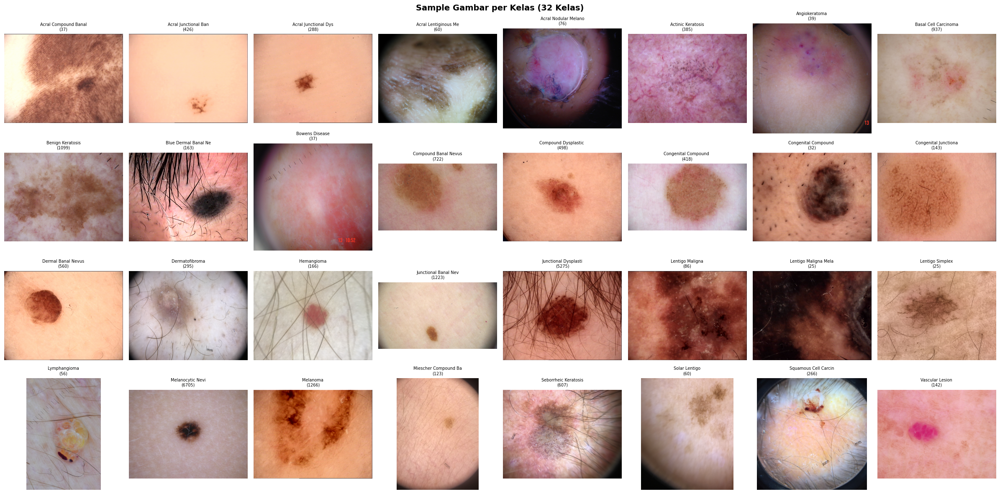


KESIMPULAN
Corrupt      : 0 gambar
Duplikat     : 2 gambar
Terlalu kecil: 0 gambar
Perlu oversample: 16 kelas

DATA SIAP UNTUK MODELING!


In [10]:
# ============================================
# CEK MENDALAM SEBELUM MODELING
# ============================================
import os
import hashlib
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

DATA_DIR = '/content/MERGED_DATASET'

print("="*70)
print("CEK 1: GAMBAR CORRUPT / RUSAK")
print("="*70)
corrupt = []
total_checked = 0
for cls in sorted(os.listdir(DATA_DIR)):
    cls_path = os.path.join(DATA_DIR, cls)
    if not os.path.isdir(cls_path):
        continue
    for f in os.listdir(cls_path):
        if f.endswith(('.jpg', '.png')):
            total_checked += 1
            try:
                img = Image.open(os.path.join(cls_path, f))
                img.verify()
            except:
                corrupt.append(os.path.join(cls, f))

print(f"Total dicek: {total_checked}")
print(f"Corrupt: {len(corrupt)}")
if corrupt:
    for c in corrupt[:10]:
        print(f"  {c}")

print(f"\n{'='*70}")
print("CEK 2: DUPLIKAT GAMBAR (ANTAR KELAS)")
print("="*70)
hash_dict = {}
duplicates = []
for cls in sorted(os.listdir(DATA_DIR)):
    cls_path = os.path.join(DATA_DIR, cls)
    if not os.path.isdir(cls_path):
        continue
    for f in os.listdir(cls_path):
        if f.endswith(('.jpg', '.png')):
            fp = os.path.join(cls_path, f)
            file_hash = hashlib.md5(open(fp, 'rb').read()).hexdigest()
            if file_hash in hash_dict:
                duplicates.append((fp, hash_dict[file_hash]))
            else:
                hash_dict[file_hash] = fp

print(f"Duplikat antar kelas: {len(duplicates)}")
if duplicates:
    for d in duplicates[:5]:
        print(f"  {d[0]}")
        print(f"    = {d[1]}")

print(f"\n{'='*70}")
print("CEK 3: UKURAN GAMBAR")
print("="*70)
sizes = []
too_small = []
for cls in sorted(os.listdir(DATA_DIR)):
    cls_path = os.path.join(DATA_DIR, cls)
    if not os.path.isdir(cls_path):
        continue
    files = [f for f in os.listdir(cls_path) if f.endswith(('.jpg', '.png'))]
    for f in files[:5]:
        img = Image.open(os.path.join(cls_path, f))
        w, h = img.size
        sizes.append((w, h))
        if w < 100 or h < 100:
            too_small.append(os.path.join(cls, f))

unique_sizes = list(set(sizes))
print(f"Ukuran gambar ditemukan: {unique_sizes[:10]}")
print(f"Gambar terlalu kecil (<100px): {len(too_small)}")

print(f"\n{'='*70}")
print("CEK 4: DISTRIBUSI KELAS (IMBALANCE)")
print("="*70)
class_counts = {}
for cls in sorted(os.listdir(DATA_DIR)):
    cls_path = os.path.join(DATA_DIR, cls)
    if os.path.isdir(cls_path):
        n = len([f for f in os.listdir(cls_path) if f.endswith(('.jpg', '.png'))])
        if n >= 25:
            class_counts[cls] = n

total = sum(class_counts.values())
print(f"Total kelas valid: {len(class_counts)}")
print(f"Total gambar: {total}")
print(f"\nDistribusi:")
for cls, n in sorted(class_counts.items(), key=lambda x: -x[1]):
    pct = n / total * 100
    status = "OVERSAMPLING NEEDED" if n < 200 else "OK"
    print(f"  {cls:<45} {n:>6} ({pct:>5.1f}%) {status}")

need_oversample = sum(1 for n in class_counts.values() if n < 200)
print(f"\nKelas butuh oversampling: {need_oversample} dari {len(class_counts)}")
print(f"Rasio max/min: {max(class_counts.values())}/{min(class_counts.values())} = {max(class_counts.values())/min(class_counts.values()):.0f}x")

print(f"\n{'='*70}")
print("CEK 5: SAMPLE GAMBAR PER KELAS")
print("="*70)
fig, axes = plt.subplots(4, 8, figsize=(24, 12))
axes = axes.flatten()

for i, cls in enumerate(sorted(class_counts.keys())):
    if i >= 32:
        break
    cls_path = os.path.join(DATA_DIR, cls)
    files = [f for f in os.listdir(cls_path) if f.endswith(('.jpg', '.png'))]
    if files:
        img = Image.open(os.path.join(cls_path, files[0]))
        axes[i].imshow(img)
        axes[i].set_title(f"{cls[:20]}\n({class_counts[cls]})", fontsize=7)
    axes[i].axis('off')

plt.suptitle('Sample Gambar per Kelas (32 Kelas)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print(f"\n{'='*70}")
print("KESIMPULAN")
print("="*70)
print(f"Corrupt      : {len(corrupt)} gambar")
print(f"Duplikat     : {len(duplicates)} gambar")
print(f"Terlalu kecil: {len(too_small)} gambar")
print(f"Perlu oversample: {need_oversample} kelas")
if len(corrupt) == 0 and len(too_small) == 0:
    print("\nDATA SIAP UNTUK MODELING!")
else:
    print("\nADA MASALAH YANG PERLU DIPERBAIKI DULU!")

# TANGANI MASALAH + OVERSAMPLE + VISUALISASI

STEP 1: Hapus duplikat...
  Hapus: ham_ISIC_0029861.jpg
  Hapus: ham_ISIC_0024777.jpg
  Duplikat dihapus!

STEP 2: Distribusi SEBELUM oversample...
  Total: 22238 gambar, 32 kelas

STEP 3: Oversampling kelas minoritas...
  Target per kelas: 216 gambar (median)
  Acral Compound Banal Nevus                    37 ->   216 (+179)
  Acral Lentiginous Melanoma                    60 ->   216 (+156)
  Acral Nodular Melanoma                        76 ->   216 (+140)
  Angiokeratoma                                 39 ->   216 (+177)
  Blue Dermal Banal Nevus                      163 ->   216 (+53)
  Bowens Disease                                37 ->   216 (+179)
  Congenital Compound Dysplastic Nevus          32 ->   216 (+184)
  Congenital Junctional Banal Nevus            143 ->   216 (+73)
  Hemangioma                                   166 ->   216 (+50)
  Lentigo Maligna                               86 ->   216 (+130)
  Lentigo Maligna Melanoma                      25 ->   216 (+191)
  Len

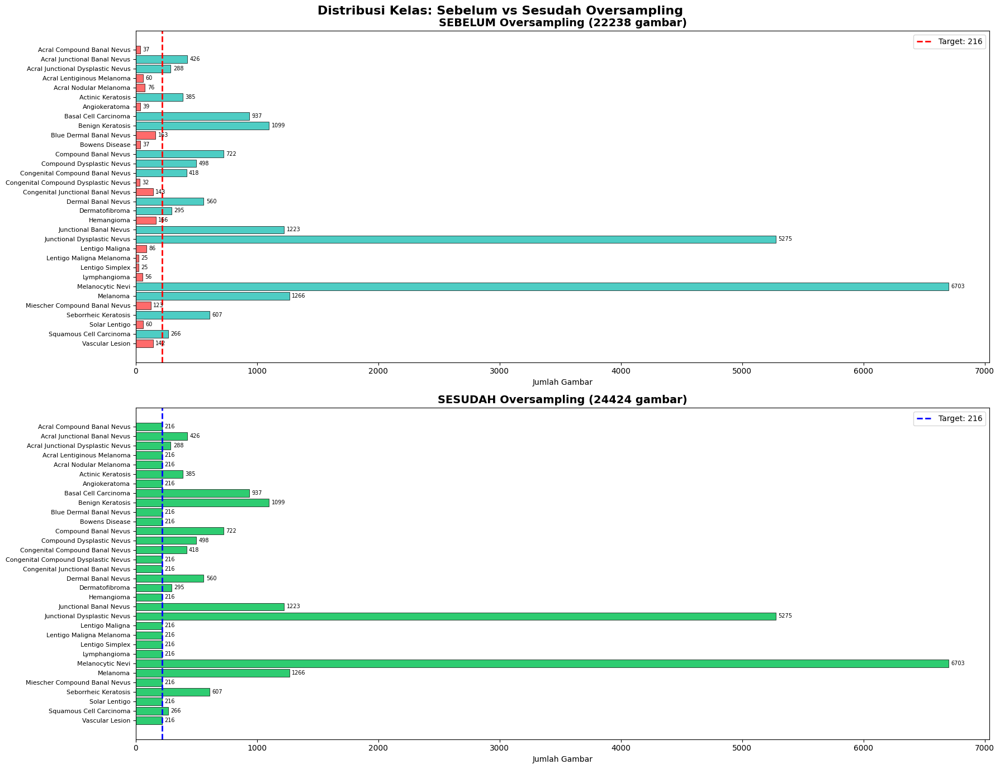

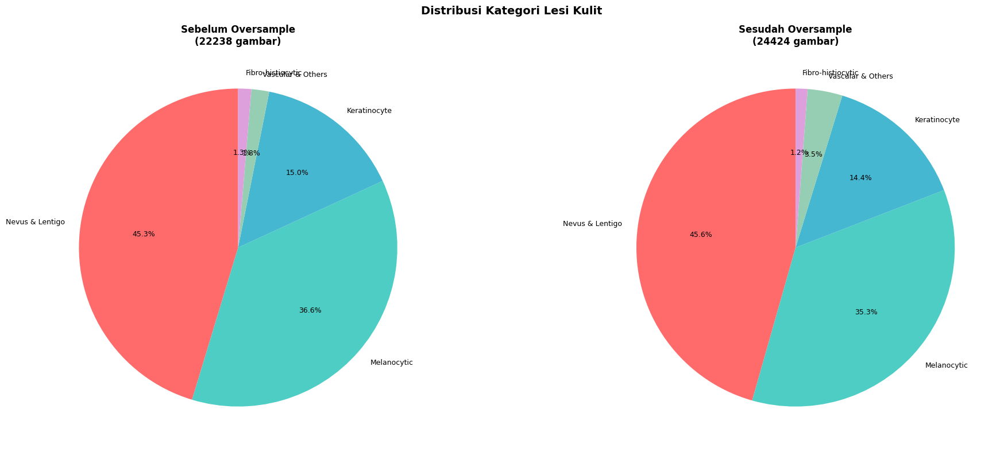


RINGKASAN FINAL
Duplikat dihapus    : 2
Corrupt             : 0
Kelas               : 32
Gambar sebelum      : 22238
Gambar sesudah      : 24424
Rasio sebelum       : 6703/25 = 268x
Rasio sesudah       : 6703/216 = 31.0x

Visualisasi saved ke Google Drive!
DATA SIAP UNTUK MODELING!


In [11]:
# ============================================
# TANGANI MASALAH + OVERSAMPLE + VISUALISASI
# ============================================
import os
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt

DATA_DIR = '/content/MERGED_DATASET'

# ============================================
# STEP 1: HAPUS 2 DUPLIKAT
# ============================================
print("STEP 1: Hapus duplikat...")
dup1 = '/content/MERGED_DATASET/Melanocytic Nevi/ham_ISIC_0029861.jpg'
dup2 = '/content/MERGED_DATASET/Melanocytic Nevi/ham_ISIC_0024777.jpg'
for d in [dup1, dup2]:
    if os.path.exists(d):
        os.remove(d)
        print(f"  Hapus: {os.path.basename(d)}")
print("  Duplikat dihapus!")

# ============================================
# STEP 2: HITUNG DISTRIBUSI SEBELUM OVERSAMPLE
# ============================================
print("\nSTEP 2: Distribusi SEBELUM oversample...")
before = {}
for cls in sorted(os.listdir(DATA_DIR)):
    p = os.path.join(DATA_DIR, cls)
    if os.path.isdir(p):
        n = len([f for f in os.listdir(p) if f.endswith(('.jpg','.png'))])
        if n >= 25:
            before[cls] = n

total_before = sum(before.values())
print(f"  Total: {total_before} gambar, {len(before)} kelas")

# ============================================
# STEP 3: OVERSAMPLE KELAS MINORITAS
# ============================================
print("\nSTEP 3: Oversampling kelas minoritas...")

# Target: median dari semua kelas (biar tidak terlalu ekstrem)
counts = list(before.values())
target = int(np.median(counts))
print(f"  Target per kelas: {target} gambar (median)")

oversampled_count = {}
for cls, n in before.items():
    cls_path = os.path.join(DATA_DIR, cls)
    files = [f for f in os.listdir(cls_path) if f.endswith(('.jpg', '.png'))]

    if n < target:
        # Perlu oversample
        need = target - n
        random.seed(42)
        for i in range(need):
            src_file = random.choice(files)
            src = os.path.join(cls_path, src_file)
            name, ext = os.path.splitext(src_file)
            dst = os.path.join(cls_path, f'{name}_oversample_{i}{ext}')
            if not os.path.exists(dst):
                shutil.copy2(src, dst)

        new_count = len([f for f in os.listdir(cls_path) if f.endswith(('.jpg','.png'))])
        oversampled_count[cls] = new_count
        print(f"  {cls[:40]:<42} {n:>5} -> {new_count:>5} (+{new_count - n})")
    else:
        oversampled_count[cls] = n

# ============================================
# STEP 4: DISTRIBUSI SESUDAH OVERSAMPLE
# ============================================
print(f"\nSTEP 4: Distribusi SESUDAH oversample...")
after = {}
for cls in sorted(os.listdir(DATA_DIR)):
    p = os.path.join(DATA_DIR, cls)
    if os.path.isdir(p):
        n = len([f for f in os.listdir(p) if f.endswith(('.jpg','.png'))])
        if n >= 25:
            after[cls] = n

total_after = sum(after.values())
print(f"  Total: {total_after} gambar, {len(after)} kelas")
print(f"  Rasio max/min: {max(after.values())}/{min(after.values())} = {max(after.values())/min(after.values()):.1f}x")

# ============================================
# STEP 5: VISUALISASI BEFORE vs AFTER
# ============================================
fig, axes = plt.subplots(2, 1, figsize=(18, 14))

classes = list(before.keys())
before_vals = [before[c] for c in classes]
after_vals = [after[c] for c in classes]

# BEFORE
colors_before = ['#FF6B6B' if v < target else '#4ECDC4' for v in before_vals]
axes[0].barh(range(len(classes)), before_vals, color=colors_before, edgecolor='black', linewidth=0.5)
axes[0].set_yticks(range(len(classes)))
axes[0].set_yticklabels(classes, fontsize=8)
axes[0].set_title(f'SEBELUM Oversampling ({total_before} gambar)', fontweight='bold', fontsize=14)
axes[0].set_xlabel('Jumlah Gambar')
axes[0].axvline(x=target, color='red', linestyle='--', linewidth=2, label=f'Target: {target}')
axes[0].legend(fontsize=10)
axes[0].invert_yaxis()
for i, v in enumerate(before_vals):
    axes[0].text(v + 20, i, str(v), va='center', fontsize=7)

# AFTER
colors_after = ['#2ECC71' for _ in after_vals]
axes[1].barh(range(len(classes)), after_vals, color=colors_after, edgecolor='black', linewidth=0.5)
axes[1].set_yticks(range(len(classes)))
axes[1].set_yticklabels(classes, fontsize=8)
axes[1].set_title(f'SESUDAH Oversampling ({total_after} gambar)', fontweight='bold', fontsize=14)
axes[1].set_xlabel('Jumlah Gambar')
axes[1].axvline(x=target, color='blue', linestyle='--', linewidth=2, label=f'Target: {target}')
axes[1].legend(fontsize=10)
axes[1].invert_yaxis()
for i, v in enumerate(after_vals):
    axes[1].text(v + 20, i, str(v), va='center', fontsize=7)

plt.suptitle('Distribusi Kelas: Sebelum vs Sesudah Oversampling', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/drive/My Drive/Data Projek Big Data/distribusi_oversample.png', dpi=200, bbox_inches='tight')
plt.show()

# PIE CHART PERBANDINGAN
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Kelompokkan jadi kategori besar
def categorize(cls):
    cls_lower = cls.lower()
    if 'melanoma' in cls_lower or 'melanocytic' in cls_lower:
        return 'Melanocytic'
    elif 'nevus' in cls_lower or 'lentigo' in cls_lower:
        return 'Nevus & Lentigo'
    elif 'carcinoma' in cls_lower or 'keratosis' in cls_lower or 'horn' in cls_lower or 'bowen' in cls_lower or 'paget' in cls_lower:
        return 'Keratinocyte'
    elif 'fibroma' in cls_lower or 'fibrosarcoma' in cls_lower:
        return 'Fibro-histiocytic'
    else:
        return 'Vascular & Others'

cat_before = {}
cat_after = {}
for cls in classes:
    cat = categorize(cls)
    cat_before[cat] = cat_before.get(cat, 0) + before[cls]
    cat_after[cat] = cat_after.get(cat, 0) + after[cls]

colors_pie = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#DDA0DD']
axes[0].pie(cat_before.values(), labels=cat_before.keys(), autopct='%1.1f%%',
            colors=colors_pie, startangle=90, textprops={'fontsize': 9})
axes[0].set_title(f'Sebelum Oversample\n({total_before} gambar)', fontweight='bold')

axes[1].pie(cat_after.values(), labels=cat_after.keys(), autopct='%1.1f%%',
            colors=colors_pie, startangle=90, textprops={'fontsize': 9})
axes[1].set_title(f'Sesudah Oversample\n({total_after} gambar)', fontweight='bold')

plt.suptitle('Distribusi Kategori Lesi Kulit', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/drive/My Drive/Data Projek Big Data/distribusi_kategori.png', dpi=200, bbox_inches='tight')
plt.show()

print(f"\n{'='*70}")
print("RINGKASAN FINAL")
print(f"{'='*70}")
print(f"Duplikat dihapus    : 2")
print(f"Corrupt             : 0")
print(f"Kelas               : {len(after)}")
print(f"Gambar sebelum      : {total_before}")
print(f"Gambar sesudah      : {total_after}")
print(f"Rasio sebelum       : {max(before.values())}/{min(before.values())} = {max(before.values())/min(before.values()):.0f}x")
print(f"Rasio sesudah       : {max(after.values())}/{min(after.values())} = {max(after.values())/min(after.values()):.1f}x")
print(f"\nVisualisasi saved ke Google Drive!")
print("DATA SIAP UNTUK MODELING!")

# SETUP GENERATOR 32 KELAS (MERGED DATASET)

In [12]:
# ============================================
# SETUP GENERATOR 32 KELAS (MERGED DATASET)
# ============================================
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.densenet import preprocess_input as dense_preprocess
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight

IMG_SIZE = 224
BATCH_SIZE = 32
DATA_DIR = '/content/MERGED_DATASET'

# Filter kelas valid (>= 25 gambar)
valid_classes = sorted([
    d for d in os.listdir(DATA_DIR)
    if os.path.isdir(os.path.join(DATA_DIR, d))
    and len(os.listdir(os.path.join(DATA_DIR, d))) >= 25
])
NUM_CLASSES = len(valid_classes)

print(f"GPU: {len(tf.config.list_physical_devices('GPU')) > 0}")
print(f"Kelas: {NUM_CLASSES}")

# Generator DenseNet201
dense_train_gen = ImageDataGenerator(
    preprocessing_function=dense_preprocess,
    rotation_range=30, zoom_range=0.2,
    width_shift_range=0.15, height_shift_range=0.15,
    shear_range=0.15, brightness_range=[0.8, 1.2],
    horizontal_flip=True, vertical_flip=True,
    fill_mode='nearest', validation_split=0.3
).flow_from_directory(
    DATA_DIR, target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE, class_mode='categorical',
    subset='training', shuffle=True, seed=42,
    classes=valid_classes
)

dense_val_gen = ImageDataGenerator(
    preprocessing_function=dense_preprocess,
    validation_split=0.3
).flow_from_directory(
    DATA_DIR, target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE, class_mode='categorical',
    subset='validation', shuffle=False, seed=42,
    classes=valid_classes
)

# Generator MobileNetV2
mobile_train_gen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30, zoom_range=0.2,
    width_shift_range=0.15, height_shift_range=0.15,
    shear_range=0.15, brightness_range=[0.8, 1.2],
    horizontal_flip=True, vertical_flip=True,
    fill_mode='nearest', validation_split=0.3
).flow_from_directory(
    DATA_DIR, target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE, class_mode='categorical',
    subset='training', shuffle=True, seed=42,
    classes=valid_classes
)

mobile_val_gen = ImageDataGenerator(
    rescale=1./255, validation_split=0.3
).flow_from_directory(
    DATA_DIR, target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE, class_mode='categorical',
    subset='validation', shuffle=False, seed=42,
    classes=valid_classes
)

# Class weights
classes_arr = np.unique(dense_train_gen.classes)
cw = compute_class_weight('balanced', classes=classes_arr, y=dense_train_gen.classes)
class_weights = dict(enumerate(cw))
class_names = list(dense_train_gen.class_indices.keys())

print(f"Train: {dense_train_gen.samples}")
print(f"Val: {dense_val_gen.samples}")
print(f"Class weights ready!")
print("Done! Siap modeling!")

GPU: True
Kelas: 32
Found 17118 images belonging to 32 classes.
Found 7306 images belonging to 32 classes.
Found 17118 images belonging to 32 classes.
Found 7306 images belonging to 32 classes.
Train: 17118
Val: 7306
Class weights ready!
Done! Siap modeling!


# MODEL 1: DENSENET201 (32 KELAS MERGED)

In [13]:
# ============================================
# MODEL 1: DENSENET201 (32 KELAS MERGED)
# ============================================
from tensorflow.keras.applications import DenseNet201

base_dense = DenseNet201(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
base_dense.trainable = False

x = base_dense.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.4)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
output = Dense(NUM_CLASSES, activation='softmax')(x)

model_dense = Model(inputs=base_dense.input, outputs=output)
model_dense.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

cb = [
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
]

# Phase 1: Train head
print("DenseNet201 Phase 1: Training head...")
h1 = model_dense.fit(
    dense_train_gen, validation_data=dense_val_gen,
    epochs=10, callbacks=cb,
    class_weight=class_weights, verbose=1
)

# Phase 2: Fine-tune
print("\nDenseNet201 Phase 2: Fine-tuning...")
base_dense.trainable = True
for layer in base_dense.layers[:-50]:
    layer.trainable = False

model_dense.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

h2 = model_dense.fit(
    dense_train_gen, validation_data=dense_val_gen,
    epochs=10, callbacks=cb,
    class_weight=class_weights, verbose=1
)
print("DenseNet201 - DONE!")

74836368/74836368 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
DenseNet201 Phase 1: Training head...
Epoch 1/10
535/535 ━━━━━━━━━━━━━━━━━━━━ 803s 1s/step - accuracy: 0.3200 - loss: 2.1338 - val_accuracy: 0.4557 - val_loss: 1.7376 - learning_rate: 0.0010
Epoch 2/10
535/535 ━━━━━━━━━━━━━━━━━━━━ 696s 1s/step - accuracy: 0.4162 - loss: 1.5031 - val_accuracy: 0.4926 - val_loss: 1.5206 - learning_rate: 0.0010
Epoch 3/10
535/535 ━━━━━━━━━━━━━━━━━━━━ 703s 1s/step - accuracy: 0.4427 - loss: 1.3139 - val_accuracy: 0.5022 - val_loss: 1.5615 - learning_rate: 0.0010
Epoch 4/10
535/535 ━━━━━━━━━━━━━━━━━━━━ 674s 1s/step - accuracy: 0.4749 - loss: 1.2069 - val_accuracy: 0.4640 - val_loss: 1.6058 - learning_rate: 0.0010
Epoch 5/10
535/535 ━━━━━━━━━━━━━━━━━━━━ 660s 1s/step - accuracy: 0.4793 - loss: 1.1156 - val_accuracy: 0.4687 - val_loss: 1.6889 - learning_rate: 0.0010
Epoch 6/10
535/535 ━━━━━━━━━━━━━━━━━━━━ 695s 1s/step - accuracy: 0.5079 - loss: 0.9899 - val_accuracy: 0.5101 - val_loss: 1.4830 - learning_rate: 


# EVALUASI DENSENET201 - MERGED DATASET

In [15]:
# ============================================
# EVALUASI DENSENET201 - MERGED DATASET
# ============================================
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import numpy as np

dense_test_gen = ImageDataGenerator(
    preprocessing_function=dense_preprocess
).flow_from_directory(
    DATA_DIR, target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE, class_mode='categorical',
    shuffle=False, classes=valid_classes
)

print("Predicting DenseNet201...")
dense_pred = model_dense.predict(dense_test_gen, verbose=1)

y_true  = dense_test_gen.classes
y_dense = np.argmax(dense_pred, axis=1)
acc_dense = accuracy_score(y_true, y_dense)

print(f"\n{'='*60}")
print(f"TEST ACCURACY - DenseNet201: {acc_dense*100:.2f}%")
print(f"{'='*60}")
print(classification_report(y_true, y_dense, target_names=class_names, zero_division=0))

Found 24424 images belonging to 32 classes.
Predicting DenseNet201...
764/764 ━━━━━━━━━━━━━━━━━━━━ 531s 657ms/step

TEST ACCURACY - DenseNet201: 64.00%
                                      precision    recall  f1-score   support

          Acral Compound Banal Nevus       0.91      0.75      0.82       216
        Acral Junctional Banal Nevus       0.76      0.77      0.77       426
   Acral Junctional Dysplastic Nevus       0.47      0.67      0.55       288
          Acral Lentiginous Melanoma       0.92      0.98      0.95       216
              Acral Nodular Melanoma       0.95      0.95      0.95       216
                   Actinic Keratosis       0.55      0.57      0.56       385
                       Angiokeratoma       0.97      0.98      0.98       216
                Basal Cell Carcinoma       0.65      0.56      0.61       937
                    Benign Keratosis       0.49      0.69      0.57      1099
             Blue Dermal Banal Nevus       0.76      0.92      0.83

# VISUALISASI AKURASI PER KELAS - DENSENET201

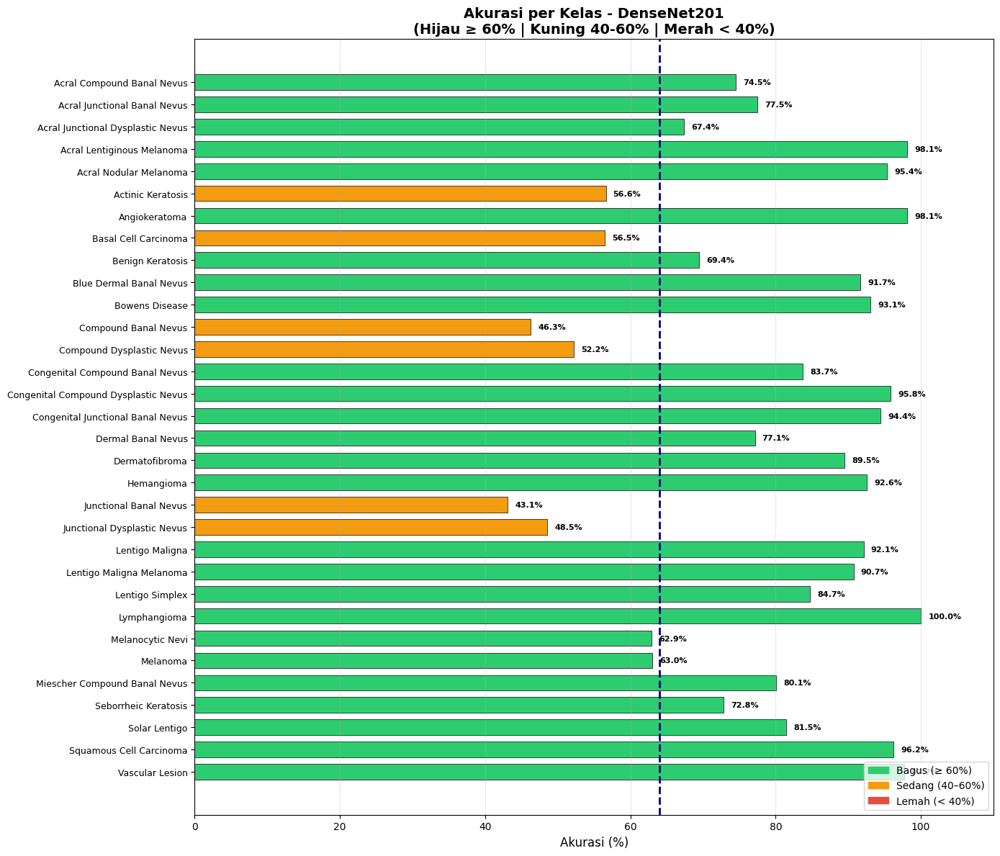

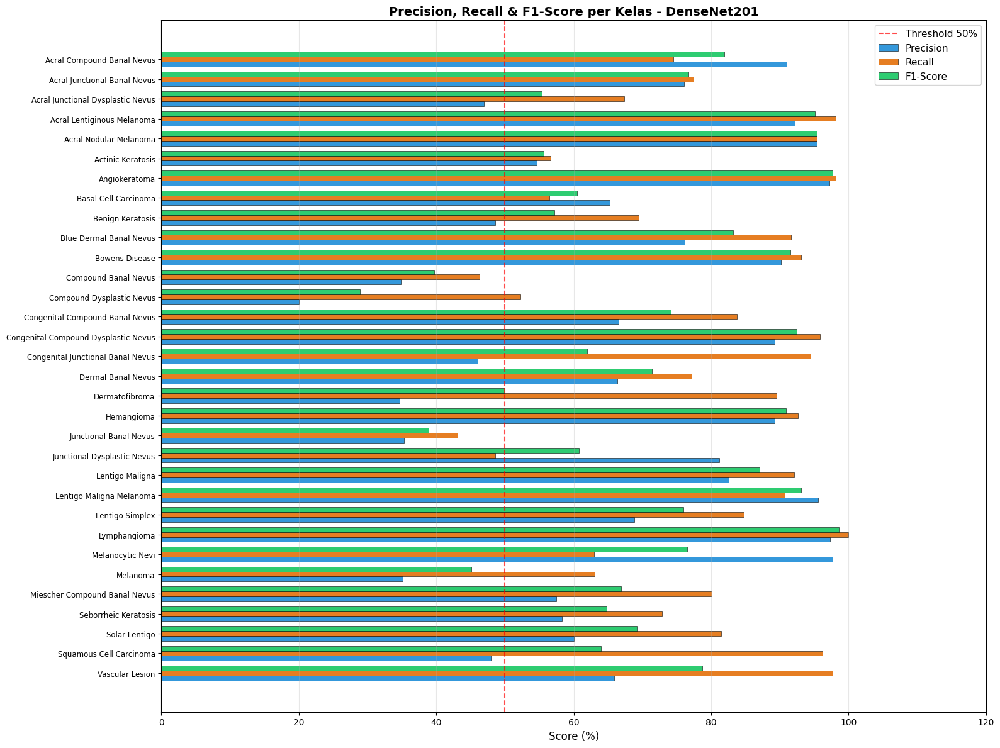

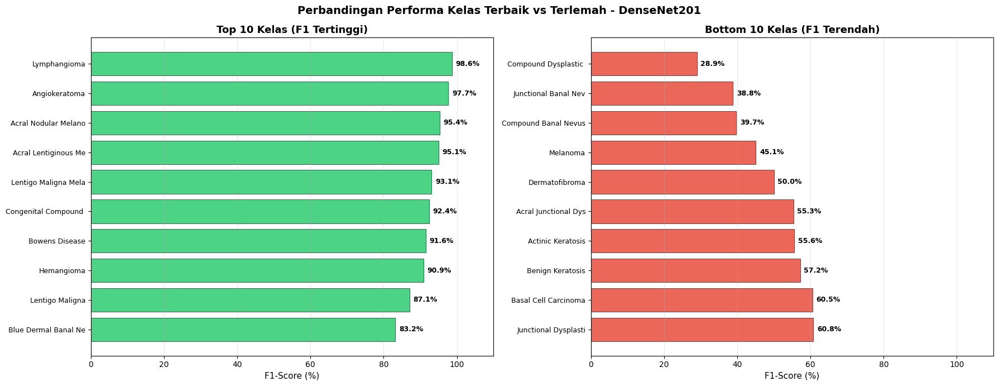

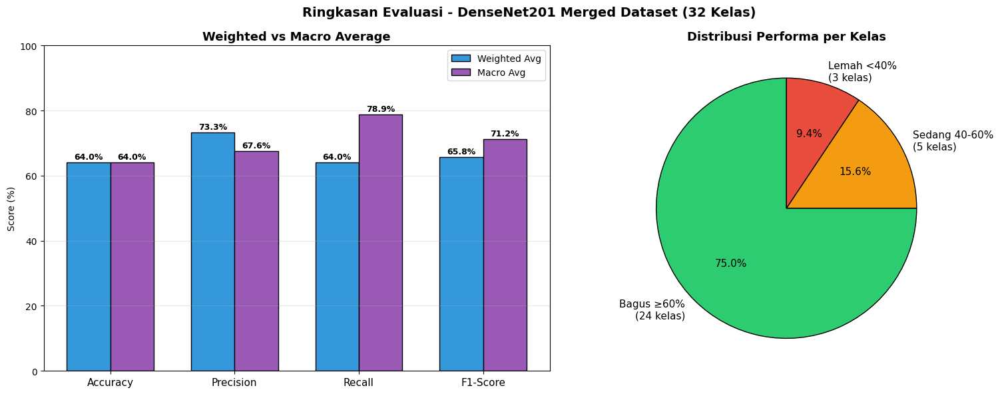

Semua visualisasi evaluasi selesai & tersimpan di Google Drive!

Ringkasan:
  Kelas bagus  (F1 ≥ 0.6) : 24 kelas
  Kelas sedang (F1 0.4-0.6): 5 kelas
  Kelas lemah  (F1 < 0.4)  : 3 kelas


In [16]:
# ============================================
# VISUALISASI AKURASI PER KELAS - DENSENET201
# ============================================
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
from sklearn.metrics import f1_score, precision_score, recall_score

# Hitung metrik per kelas
f1_per   = f1_score(y_true, y_dense, average=None, zero_division=0)
prec_per = precision_score(y_true, y_dense, average=None, zero_division=0)
rec_per  = recall_score(y_true, y_dense, average=None, zero_division=0)

# Akurasi per kelas dari confusion matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_true, y_dense)
acc_per = cm.diagonal() / cm.sum(axis=1)

# ============================================
# CHART 1: AKURASI PER KELAS (HORIZONTAL BAR)
# ============================================
fig, ax = plt.subplots(figsize=(14, 12))

colors = ['#2ecc71' if v >= 0.6 else '#f39c12' if v >= 0.4 else '#e74c3c' for v in acc_per]
bars = ax.barh(range(NUM_CLASSES), acc_per * 100,
               color=colors, edgecolor='black', linewidth=0.5, height=0.7)

ax.set_yticks(range(NUM_CLASSES))
ax.set_yticklabels(class_names, fontsize=9)
ax.set_xlabel('Akurasi (%)', fontsize=12)
ax.set_title('Akurasi per Kelas - DenseNet201\n(Hijau ≥ 60% | Kuning 40-60% | Merah < 40%)',
             fontweight='bold', fontsize=14)
ax.axvline(x=64, color='navy', linestyle='--', linewidth=2, label=f'Overall Acc: 64%')
ax.set_xlim(0, 110)
ax.invert_yaxis()
ax.grid(axis='x', alpha=0.3)
ax.legend(fontsize=11)

for i, v in enumerate(acc_per):
    ax.text(v * 100 + 1, i, f'{v*100:.1f}%', va='center', fontsize=8, fontweight='bold')

green_patch  = mpatches.Patch(color='#2ecc71', label='Bagus (≥ 60%)')
yellow_patch = mpatches.Patch(color='#f39c12', label='Sedang (40–60%)')
red_patch    = mpatches.Patch(color='#e74c3c', label='Lemah (< 40%)')
ax.legend(handles=[green_patch, yellow_patch, red_patch], fontsize=10, loc='lower right')

plt.tight_layout()
plt.savefig('/content/drive/My Drive/Data Projek Big Data/akurasi_per_kelas.png',
            dpi=200, bbox_inches='tight')
plt.show()

# ============================================
# CHART 2: PRECISION, RECALL, F1 PER KELAS
# ============================================
fig, ax = plt.subplots(figsize=(16, 12))

x    = np.arange(NUM_CLASSES)
w    = 0.25
b1 = ax.barh(x + w,   prec_per * 100, w, label='Precision', color='#3498db', edgecolor='black', linewidth=0.4)
b2 = ax.barh(x,       rec_per  * 100, w, label='Recall',    color='#e67e22', edgecolor='black', linewidth=0.4)
b3 = ax.barh(x - w,   f1_per   * 100, w, label='F1-Score',  color='#2ecc71', edgecolor='black', linewidth=0.4)

ax.set_yticks(x)
ax.set_yticklabels(class_names, fontsize=8.5)
ax.set_xlabel('Score (%)', fontsize=12)
ax.set_title('Precision, Recall & F1-Score per Kelas - DenseNet201',
             fontweight='bold', fontsize=14)
ax.axvline(x=50, color='red', linestyle='--', linewidth=1.5, alpha=0.7, label='Threshold 50%')
ax.set_xlim(0, 120)
ax.invert_yaxis()
ax.legend(fontsize=11)
ax.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.savefig('/content/drive/My Drive/Data Projek Big Data/precision_recall_f1_per_kelas.png',
            dpi=200, bbox_inches='tight')
plt.show()

# ============================================
# CHART 3: RADAR CHART - TOP 10 vs BOTTOM 10
# ============================================
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Top 10 kelas berdasarkan F1
top10_idx    = np.argsort(f1_per)[-10:][::-1]
bottom10_idx = np.argsort(f1_per)[:10]

for ax, idx, title, color in zip(
    axes,
    [top10_idx, bottom10_idx],
    ['Top 10 Kelas (F1 Tertinggi)', 'Bottom 10 Kelas (F1 Terendah)'],
    ['#2ecc71', '#e74c3c']
):
    names  = [class_names[i][:20] for i in idx]
    values = f1_per[idx] * 100

    bars = ax.barh(range(10), values, color=color, edgecolor='black', linewidth=0.5, alpha=0.85)
    ax.set_yticks(range(10))
    ax.set_yticklabels(names, fontsize=9)
    ax.set_xlabel('F1-Score (%)', fontsize=11)
    ax.set_title(title, fontweight='bold', fontsize=13)
    ax.set_xlim(0, 110)
    ax.invert_yaxis()
    ax.grid(axis='x', alpha=0.3)
    for i, v in enumerate(values):
        ax.text(v + 1, i, f'{v:.1f}%', va='center', fontsize=9, fontweight='bold')

plt.suptitle('Perbandingan Performa Kelas Terbaik vs Terlemah - DenseNet201',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/drive/My Drive/Data Projek Big Data/top_bottom_kelas.png',
            dpi=200, bbox_inches='tight')
plt.show()

# ============================================
# CHART 4: RINGKASAN METRIK KESELURUHAN
# ============================================
from sklearn.metrics import f1_score, precision_score, recall_score

p_w  = precision_score(y_true, y_dense, average='weighted', zero_division=0) * 100
r_w  = recall_score(y_true, y_dense,    average='weighted', zero_division=0) * 100
f1_w = f1_score(y_true, y_dense,        average='weighted', zero_division=0) * 100
p_m  = precision_score(y_true, y_dense, average='macro',    zero_division=0) * 100
r_m  = recall_score(y_true, y_dense,    average='macro',    zero_division=0) * 100
f1_m = f1_score(y_true, y_dense,        average='macro',    zero_division=0) * 100

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

metrics      = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
weighted_val = [acc_dense*100, p_w, r_w, f1_w]
macro_val    = [acc_dense*100, p_m, r_m, f1_m]

x = np.arange(len(metrics))
w = 0.35
axes[0].bar(x - w/2, weighted_val, w, label='Weighted Avg', color='#3498db', edgecolor='black')
axes[0].bar(x + w/2, macro_val,    w, label='Macro Avg',    color='#9b59b6', edgecolor='black')
axes[0].set_title('Weighted vs Macro Average', fontweight='bold', fontsize=13)
axes[0].set_xticks(x)
axes[0].set_xticklabels(metrics, fontsize=11)
axes[0].set_ylabel('Score (%)')
axes[0].set_ylim(0, 100)
axes[0].legend(fontsize=10)
axes[0].grid(axis='y', alpha=0.3)
for i, (vw, vm) in enumerate(zip(weighted_val, macro_val)):
    axes[0].text(i - w/2, vw + 1, f'{vw:.1f}%', ha='center', fontsize=9, fontweight='bold')
    axes[0].text(i + w/2, vm + 1, f'{vm:.1f}%', ha='center', fontsize=9, fontweight='bold')

# Pie: distribusi kelas berdasarkan performa
bagus  = sum(1 for v in f1_per if v >= 0.6)
sedang = sum(1 for v in f1_per if 0.4 <= v < 0.6)
lemah  = sum(1 for v in f1_per if v < 0.4)
axes[1].pie([bagus, sedang, lemah],
            labels=[f'Bagus ≥60%\n({bagus} kelas)',
                    f'Sedang 40-60%\n({sedang} kelas)',
                    f'Lemah <40%\n({lemah} kelas)'],
            colors=['#2ecc71', '#f39c12', '#e74c3c'],
            autopct='%1.1f%%', startangle=90,
            textprops={'fontsize': 11}, wedgeprops={'edgecolor': 'black'})
axes[1].set_title('Distribusi Performa per Kelas', fontweight='bold', fontsize=13)

plt.suptitle('Ringkasan Evaluasi - DenseNet201 Merged Dataset (32 Kelas)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/drive/My Drive/Data Projek Big Data/ringkasan_evaluasi.png',
            dpi=200, bbox_inches='tight')
plt.show()

print("Semua visualisasi evaluasi selesai & tersimpan di Google Drive!")
print(f"\nRingkasan:")
print(f"  Kelas bagus  (F1 ≥ 0.6) : {bagus} kelas")
print(f"  Kelas sedang (F1 0.4-0.6): {sedang} kelas")
print(f"  Kelas lemah  (F1 < 0.4)  : {lemah} kelas")

# CONFUSION MATRIX - DENSENET201

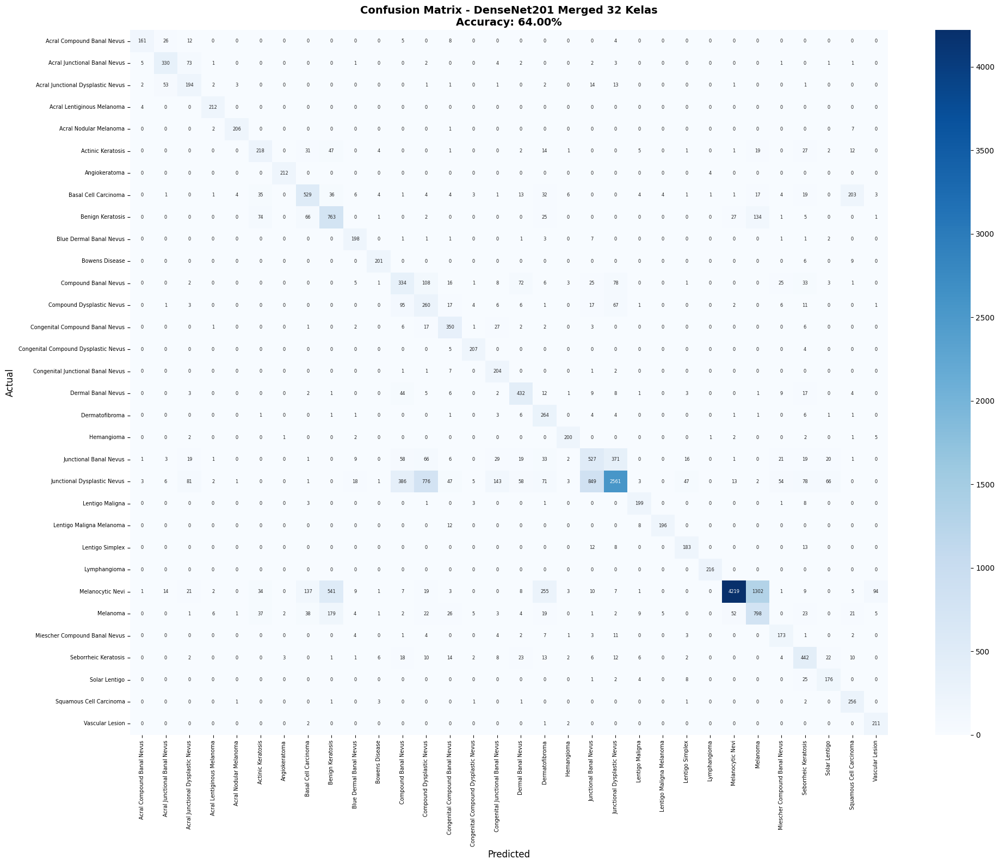

Saved!


In [17]:
# ============================================
# CONFUSION MATRIX - DENSENET201
# ============================================
import matplotlib.pyplot as plt
import seaborn as sns

cm_dense = confusion_matrix(y_true, y_dense)

fig, ax = plt.subplots(figsize=(20, 16))
sns.heatmap(cm_dense, annot=True, fmt='d', cmap='Blues', ax=ax,
            xticklabels=class_names, yticklabels=class_names,
            annot_kws={'size': 6})
ax.set_title(f'Confusion Matrix - DenseNet201 Merged 32 Kelas\nAccuracy: {acc_dense*100:.2f}%',
             fontweight='bold', fontsize=14)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('Actual', fontsize=12)
ax.tick_params(axis='x', rotation=90, labelsize=7)
ax.tick_params(axis='y', rotation=0, labelsize=7)
plt.tight_layout()
plt.savefig('/content/drive/My Drive/Data Projek Big Data/confusion_matrix_merged.png',
            dpi=200, bbox_inches='tight')
plt.show()
print("Saved!")

# ROC CURVE - DENSENET201

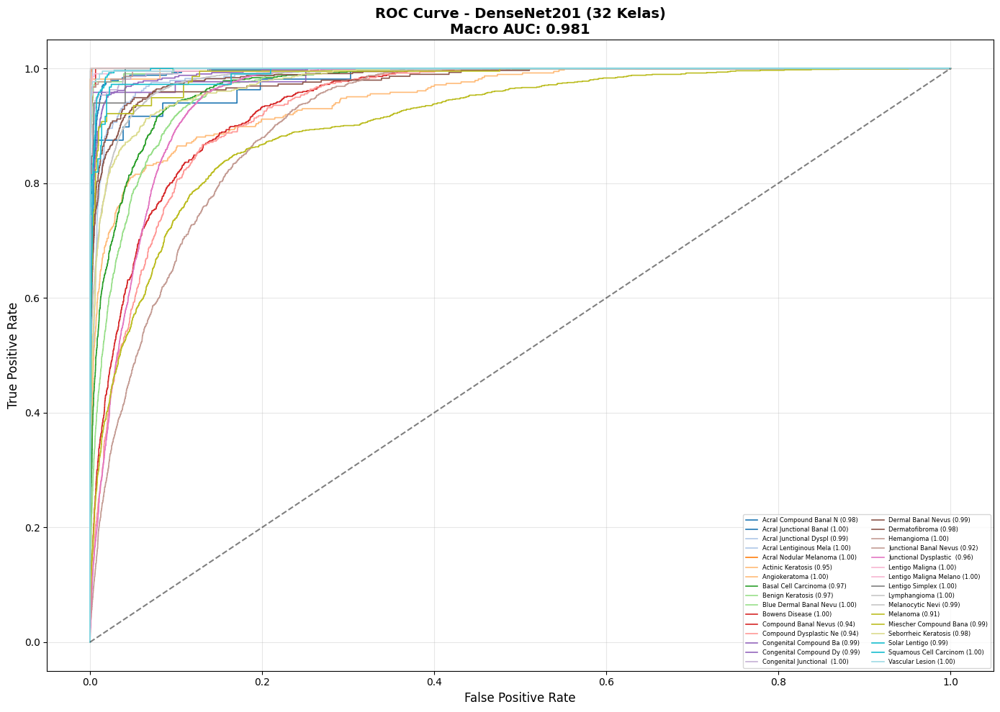

Macro AUC: 0.981
Saved!


In [18]:
# ============================================
# ROC CURVE - DENSENET201
# ============================================
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
import matplotlib.cm as cm

y_true_bin = label_binarize(y_true, classes=list(range(NUM_CLASSES)))
colors = [cm.tab20(i / NUM_CLASSES) for i in range(NUM_CLASSES)]

fig, ax = plt.subplots(figsize=(14, 10))
auc_list = []
for i in range(NUM_CLASSES):
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], dense_pred[:, i])
    roc_auc = auc(fpr, tpr)
    auc_list.append(roc_auc)
    ax.plot(fpr, tpr, color=colors[i], linewidth=1.2,
            label=f'{class_names[i][:22]} ({roc_auc:.2f})')

ax.plot([0,1], [0,1], 'k--', alpha=0.5)
ax.set_title(f'ROC Curve - DenseNet201 (32 Kelas)\nMacro AUC: {np.mean(auc_list):.3f}',
             fontweight='bold', fontsize=14)
ax.set_xlabel('False Positive Rate', fontsize=12)
ax.set_ylabel('True Positive Rate', fontsize=12)
ax.legend(loc='lower right', fontsize=6, ncol=2)
ax.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('/content/drive/My Drive/Data Projek Big Data/roc_curve_merged.png',
            dpi=200, bbox_inches='tight')
plt.show()
print(f"Macro AUC: {np.mean(auc_list):.3f}")
print("Saved!")

# TRAINING HISTORY + DASHBOARD

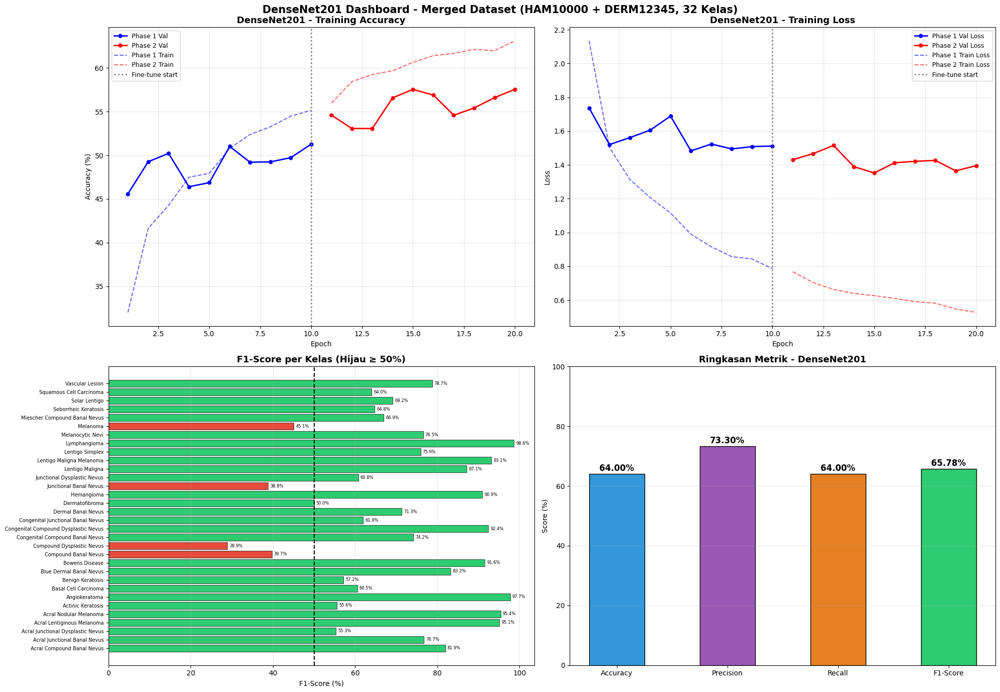

Saved!


In [19]:
# ============================================
# TRAINING HISTORY + DASHBOARD
# ============================================
from sklearn.metrics import f1_score, precision_score, recall_score

fig, axes = plt.subplots(2, 2, figsize=(20, 14))

# 1. Training History Accuracy
ep1 = list(range(1, len(h1.history['val_accuracy'])+1))
ep2 = list(range(len(ep1)+1, len(ep1)+len(h2.history['val_accuracy'])+1))
axes[0,0].plot(ep1, [v*100 for v in h1.history['val_accuracy']], 'b-o', label='Phase 1 Val', linewidth=2, markersize=5)
axes[0,0].plot(ep2, [v*100 for v in h2.history['val_accuracy']], 'r-o', label='Phase 2 Val', linewidth=2, markersize=5)
axes[0,0].plot(ep1, [v*100 for v in h1.history['accuracy']], 'b--', label='Phase 1 Train', alpha=0.6)
axes[0,0].plot(ep2, [v*100 for v in h2.history['accuracy']], 'r--', label='Phase 2 Train', alpha=0.6)
axes[0,0].axvline(x=len(ep1), color='gray', linestyle=':', linewidth=2, label='Fine-tune start')
axes[0,0].set_title('DenseNet201 - Training Accuracy', fontweight='bold', fontsize=13)
axes[0,0].set_xlabel('Epoch')
axes[0,0].set_ylabel('Accuracy (%)')
axes[0,0].legend(fontsize=9)
axes[0,0].grid(alpha=0.3)

# 2. Training History Loss
axes[0,1].plot(ep1, h1.history['val_loss'], 'b-o', label='Phase 1 Val Loss', linewidth=2, markersize=5)
axes[0,1].plot(ep2, h2.history['val_loss'], 'r-o', label='Phase 2 Val Loss', linewidth=2, markersize=5)
axes[0,1].plot(ep1, h1.history['loss'], 'b--', label='Phase 1 Train Loss', alpha=0.6)
axes[0,1].plot(ep2, h2.history['loss'], 'r--', label='Phase 2 Train Loss', alpha=0.6)
axes[0,1].axvline(x=len(ep1), color='gray', linestyle=':', linewidth=2, label='Fine-tune start')
axes[0,1].set_title('DenseNet201 - Training Loss', fontweight='bold', fontsize=13)
axes[0,1].set_xlabel('Epoch')
axes[0,1].set_ylabel('Loss')
axes[0,1].legend(fontsize=9)
axes[0,1].grid(alpha=0.3)

# 3. F1-Score per kelas
f1_per_class = f1_score(y_true, y_dense, average=None, zero_division=0)
colors_bar = ['#2ecc71' if v >= 0.5 else '#e74c3c' for v in f1_per_class]
axes[1,0].barh(range(NUM_CLASSES), f1_per_class*100, color=colors_bar, edgecolor='black', linewidth=0.5)
axes[1,0].set_yticks(range(NUM_CLASSES))
axes[1,0].set_yticklabels(class_names, fontsize=7)
axes[1,0].set_xlabel('F1-Score (%)')
axes[1,0].set_title('F1-Score per Kelas (Hijau ≥ 50%)', fontweight='bold', fontsize=13)
axes[1,0].axvline(x=50, color='black', linestyle='--', linewidth=1.5)
axes[1,0].grid(axis='x', alpha=0.3)
for i, v in enumerate(f1_per_class):
    axes[1,0].text(v*100+0.5, i, f'{v*100:.1f}%', va='center', fontsize=6)

# 4. Metrik Ringkasan
p  = precision_score(y_true, y_dense, average='weighted', zero_division=0)
r  = recall_score(y_true, y_dense,    average='weighted', zero_division=0)
f1 = f1_score(y_true, y_dense,        average='weighted', zero_division=0)
metric_names = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
metric_vals  = [acc_dense*100, p*100, r*100, f1*100]
bar_colors   = ['#3498db', '#9b59b6', '#e67e22', '#2ecc71']
bars = axes[1,1].bar(metric_names, metric_vals, color=bar_colors, edgecolor='black', width=0.5)
axes[1,1].set_title('Ringkasan Metrik - DenseNet201', fontweight='bold', fontsize=13)
axes[1,1].set_ylabel('Score (%)')
axes[1,1].set_ylim(0, 100)
for bar, val in zip(bars, metric_vals):
    axes[1,1].text(bar.get_x() + bar.get_width()/2, bar.get_height()+1,
                   f'{val:.2f}%', ha='center', fontweight='bold', fontsize=12)
axes[1,1].grid(axis='y', alpha=0.3)

plt.suptitle('DenseNet201 Dashboard - Merged Dataset (HAM10000 + DERM12345, 32 Kelas)',
             fontsize=15, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/drive/My Drive/Data Projek Big Data/dashboard_merged.png',
            dpi=200, bbox_inches='tight')
plt.show()
print("Saved!")

# PREDIKSI PADA GAMBAR ASLI

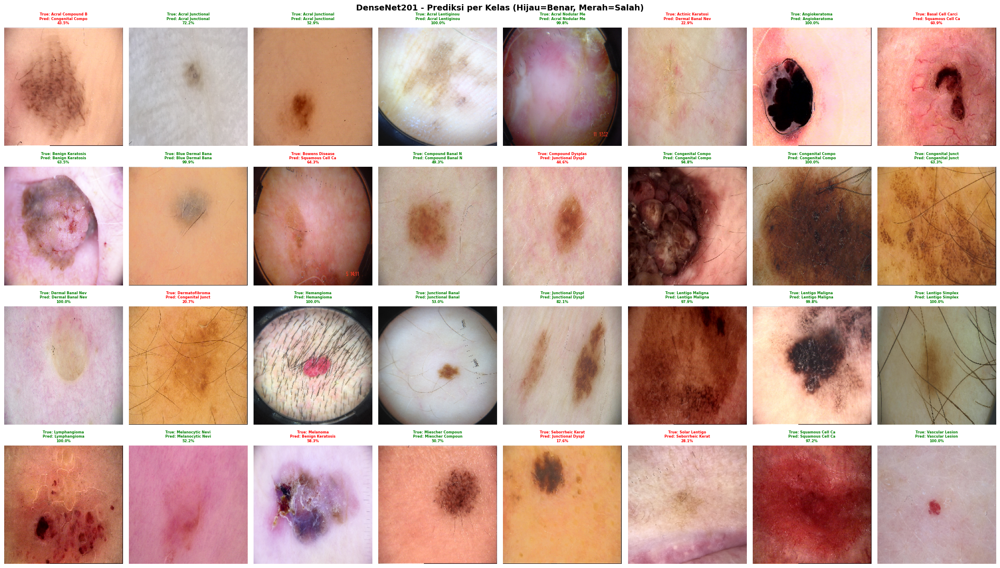

Saved!


In [20]:
# ============================================
# PREDIKSI PADA GAMBAR ASLI
# ============================================
import random
from PIL import Image
from tensorflow.keras.preprocessing.image import load_img, img_to_array

random.seed(42)
fig, axes = plt.subplots(4, 8, figsize=(24, 14))
axes = axes.flatten()

sample_files = []
for cls in valid_classes:
    cls_path = os.path.join(DATA_DIR, cls)
    files = [f for f in os.listdir(cls_path)
             if f.endswith(('.jpg','.png')) and 'oversample' not in f]
    if files:
        sample_files.append((cls, os.path.join(cls_path, random.choice(files))))

for i, (true_label, filepath) in enumerate(sample_files[:32]):
    img       = load_img(filepath, target_size=(IMG_SIZE, IMG_SIZE))
    img_array = img_to_array(img)
    img_proc  = dense_preprocess(img_array.copy())
    pred      = model_dense.predict(np.expand_dims(img_proc, 0), verbose=0)
    pred_label = class_names[np.argmax(pred)]
    confidence = np.max(pred) * 100

    axes[i].imshow(img_array.astype('uint8'))
    color = 'green' if pred_label == true_label else 'red'
    axes[i].set_title(f'True: {true_label[:16]}\nPred: {pred_label[:16]}\n{confidence:.1f}%',
                      fontsize=6, color=color, fontweight='bold')
    axes[i].axis('off')

plt.suptitle('DenseNet201 - Prediksi per Kelas (Hijau=Benar, Merah=Salah)',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/drive/My Drive/Data Projek Big Data/prediction_samples_merged.png',
            dpi=200, bbox_inches='tight')
plt.show()
print("Saved!")